# Import libraries

In [1]:
import tensorflow as tf
import glob as gb
from PIL import Image
from tensorflow.keras.models import Model
import pandas as pd
import numpy as np
from tensorflow.keras import datasets,models,layers
import seaborn as sn
import matplotlib.pyplot as plt
from tensorflow import keras
import matplotlib.pyplot as plt
import os,cv2
from keras.applications import InceptionV3
import random
import seaborn as sns

# Tensorflow
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# metrics
from sklearn.metrics import classification_report, confusion_matrix

2024-03-10 18:51:39.140911: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-10 18:51:39.141001: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-10 18:51:39.260317: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# Reading and Formatting Data

In [2]:
# Your label mapping and file paths
labels = {
    'buildings': 0,
    'forest': 1,
    'glacier': 2,
    'mountain': 3,
    'sea': 4,
    'street': 5
}

train_folder = r"/kaggle/input/intel-image-classification/seg_train/seg_train"
test_folder = r"/kaggle/input/intel-image-classification/seg_train/seg_train"

# Load training data
train_img = []
train_lbl = []

# Define common size for resizing
common_size = (224, 224)

for folder in os.listdir(train_folder):
    folder_path = os.path.join(train_folder, folder)
    files = gb.glob(pathname=os.path.join(folder_path, "*.jpg"))
    for file in files:
        image = Image.open(file)
        image = image.resize(common_size)  # Resize image to a common size
        train_img.append(np.array(image))
        train_lbl.append(labels.get(folder, -1))

train_img = np.array(train_img)
train_lbl = np.array(train_lbl)

# Load testing data
test_img = []
test_lbl = []
for folder in os.listdir(test_folder):
    folder_path = os.path.join(test_folder, folder)
    files = gb.glob(pathname=os.path.join(folder_path, "*.jpg"))
    for file in files:
        image = Image.open(file)
        image = image.resize(common_size)  # Resize image to a common size
        test_img.append(np.array(image))
        test_lbl.append(labels.get(folder, -1))

test_img = np.array(test_img)
test_lbl = np.array(test_lbl)

# Check the number of items in each set and their shapes
print("Number of items in the training set:", len(train_img))
print("Number of items in the testing set:", len(test_img))

Number of items in the training set: 14034
Number of items in the testing set: 14034


In [3]:
print("Shape of train_img:", train_img.shape)
print("Shape of train_lbl:", train_lbl.shape)
print("Shape of test_img:", test_img.shape)
print("Shape of test_lbl:", test_lbl.shape)

Shape of train_img: (14034, 224, 224, 3)
Shape of train_lbl: (14034,)
Shape of test_img: (14034, 224, 224, 3)
Shape of test_lbl: (14034,)


# Sample Data

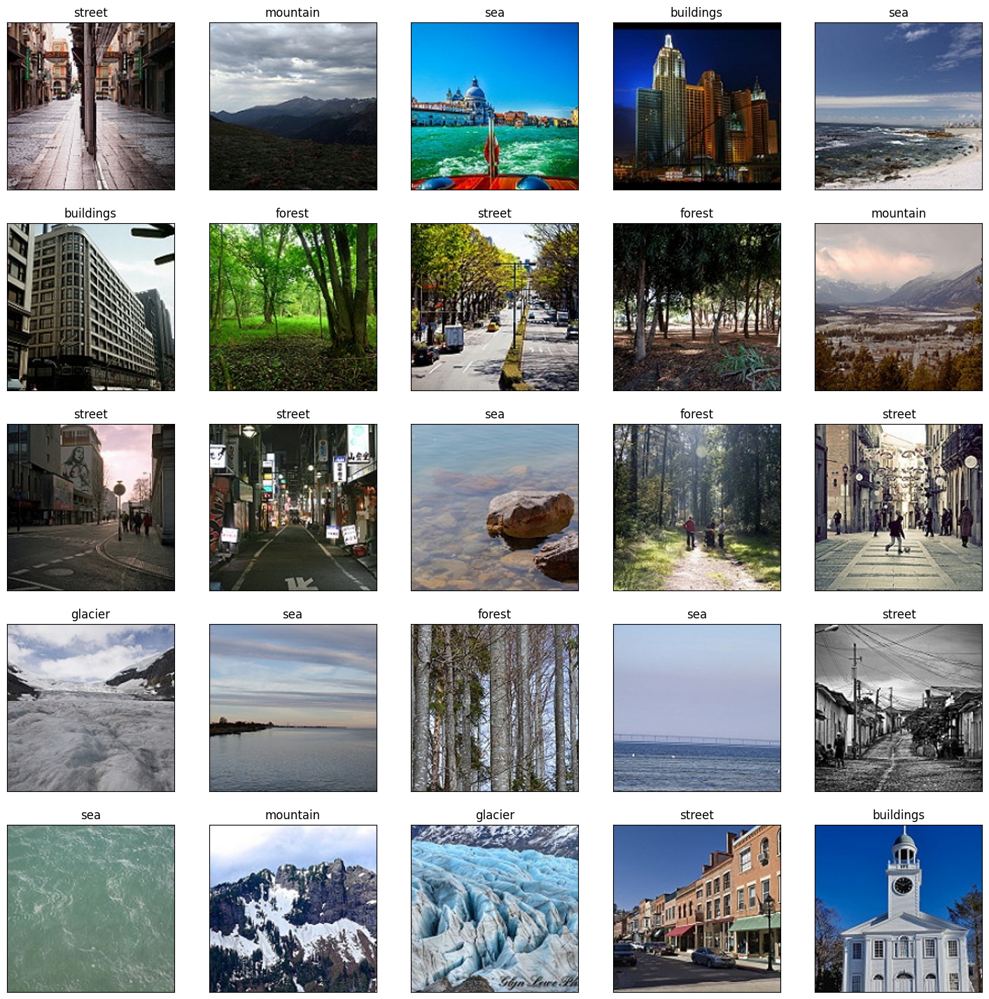

In [4]:
plt.figure(figsize=(18, 18))

random_list = random.sample(range(len(train_img)), 25)
i = 0
for j in random_list:
    plt.subplot(5, 5, i+1)
    plt.imshow(train_img[j])
    label_code = train_lbl[j]
    label_name = [key for key, value in labels.items() if value == label_code][0]
    plt.title(label_name)
    plt.xticks([])
    plt.yticks([])
    i+=1

plt.show()

# Using Pre-Trained InceptionV3

In [5]:
TotalClasses=6
inception = InceptionV3(input_shape=train_img[0].shape,weights='imagenet',include_top=False)
x= layers.Flatten()(inception.output)
pred=layers.Dense(TotalClasses,activation="softmax")(x)
model=models.Model(inputs=inception.input,outputs=pred)
model.summary()

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 111, 111,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 111, 111,  │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 111, 111,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 109, 109,  │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 109, 109,  │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 54, 54,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 54, 54,    │      5,120 │ max_pooling2d[0]… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 54, 54,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 52, 52,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 52, 52,    │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 52, 52,    │          0 │ batch_normalizat

 Total params: 22,109,990 (84.34 MB)

 Trainable params: 22,075,558 (84.21 MB)

 Non-trainable params: 34,432 (134.50 KB)

Plotting the model

In [6]:
tf.keras.utils.plot_model(model, '/kaggle/working/model.png', show_shapes=True)

model compiling

In [7]:
model.compile(optimizer="adam" , loss='sparse_categorical_crossentropy',metrics=['accuracy'])
early = EarlyStopping(patience=5, restore_best_weights=True)
# Train the model
history = model.fit(train_img, train_lbl, epochs=20, validation_data=(test_img, test_lbl), callbacks=[early])

Epoch 1/20


I0000 00:00:1710096977.241703      72 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


439/439 ━━━━━━━━━━━━━━━━━━━━ 214s 304ms/step - accuracy: 0.6301 - loss: 1.9198 - val_accuracy: 0.5487 - val_loss: 13.3084
Epoch 2/20
439/439 ━━━━━━━━━━━━━━━━━━━━ 99s 178ms/step - accuracy: 0.7170 - loss: 0.7904 - val_accuracy: 0.6541 - val_loss: 169.7499
Epoch 3/20
439/439 ━━━━━━━━━━━━━━━━━━━━ 79s 180ms/step - accuracy: 0.7881 - loss: 0.6272 - val_accuracy: 0.7924 - val_loss: 0.8887
Epoch 4/20
439/439 ━━━━━━━━━━━━━━━━━━━━ 79s 179ms/step - accuracy: 0.7984 - loss: 0.5924 - val_accuracy: 0.7858 - val_loss: 10.8028
Epoch 5/20
439/439 ━━━━━━━━━━━━━━━━━━━━ 78s 178ms/step - accuracy: 0.8465 - loss: 0.4633 - val_accuracy: 0.7976 - val_loss: 2.1573
Epoch 6/20
439/439 ━━━━━━━━━━━━━━━━━━━━ 78s 179ms/step - accuracy: 0.8485 - loss: 0.4438 - val_accuracy: 0.8883 - val_loss: 0.5453
Epoch 7/20
439/439 ━━━━━━━━━━━━━━━━━━━━ 82s 178ms/step - accuracy: 0.8699 - loss: 0.3786 - val_accuracy: 0.7416 - val_loss: 8.4408
Epoch 8/20
439/439 ━━━━━━━━━━━━━━━━━━━━ 78s 178ms/step - accuracy: 0.8861 - loss: 0.3349 

# Model Evaluation

In [8]:
loss , acc = model.evaluate(train_img , train_lbl)
print("Accuracy : ",acc)
print("loss : " , loss)

439/439 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step - accuracy: 0.8806 - loss: 0.3356
Accuracy :  0.9087216854095459
loss :  0.28239500522613525


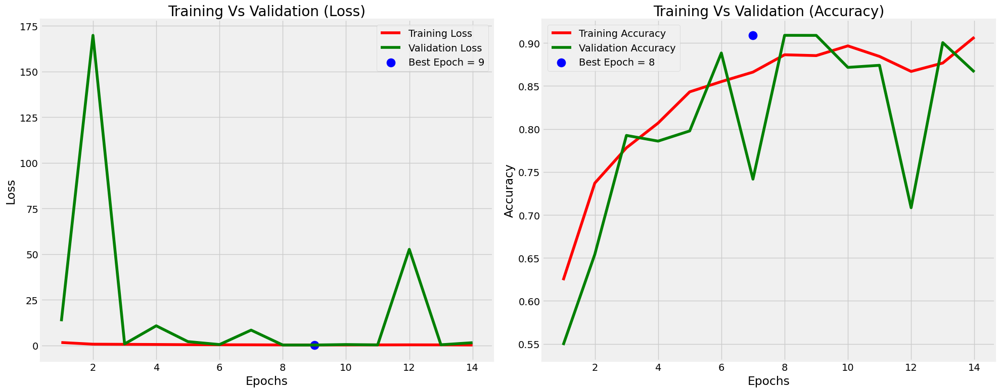

In [9]:
train_acc = history.history['accuracy']
train_loss = history.history['loss']

val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

index_loss = np.argmin(val_loss)
index_acc = np.argmax(val_acc)
val_lowest = val_loss[index_loss]
val_highest = val_acc[index_acc]

epochs = [i+1 for i in range(len(train_acc))]
loss_label = f'Best Epoch = {str(index_loss + 1)}'
acc_loss = f'Best Epoch = {str(index_acc +1)}'

#Training Accuracy
plt.figure(figsize= (20,8))
plt.style.use('fivethirtyeight')

plt.subplot(1,2,1)
plt.plot(epochs , train_loss , 'r' , label = 'Training Loss')
plt.plot(epochs , val_loss , 'g' , label = 'Validation Loss')
plt.scatter(index_loss + 1 , val_lowest , s = 150 , c = 'blue' , label= loss_label)
plt.title('Training Vs Validation (Loss)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1,2,2)
plt.plot(epochs , train_acc , 'r' , label= 'Training Accuracy')
plt.plot(epochs , val_acc , 'g' , label = 'Validation Accuracy')
plt.scatter(index_acc , val_highest , s= 150 , c= 'blue' , label = acc_loss)
plt.title('Training Vs Validation (Accuracy)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# Model Prediction

In [10]:
def get_key_from_value(dictionary, value):
    return next((key for key, val in dictionary.items() if val == value), None)

folder_pred = r"/kaggle/input/intel-image-classification/seg_pred"

for folder in os.listdir(folder_pred):
    folder_files = os.path.join(folder_pred, folder)
    files = gb.glob(pathname=os.path.join(folder_files, "*.jpg"))
    print(f"For files in folder {folder}, the number of items is {len(files)}")

For files in folder seg_pred, the number of items is 7301


439/439 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step
[3 3 3 ... 2 4 3]


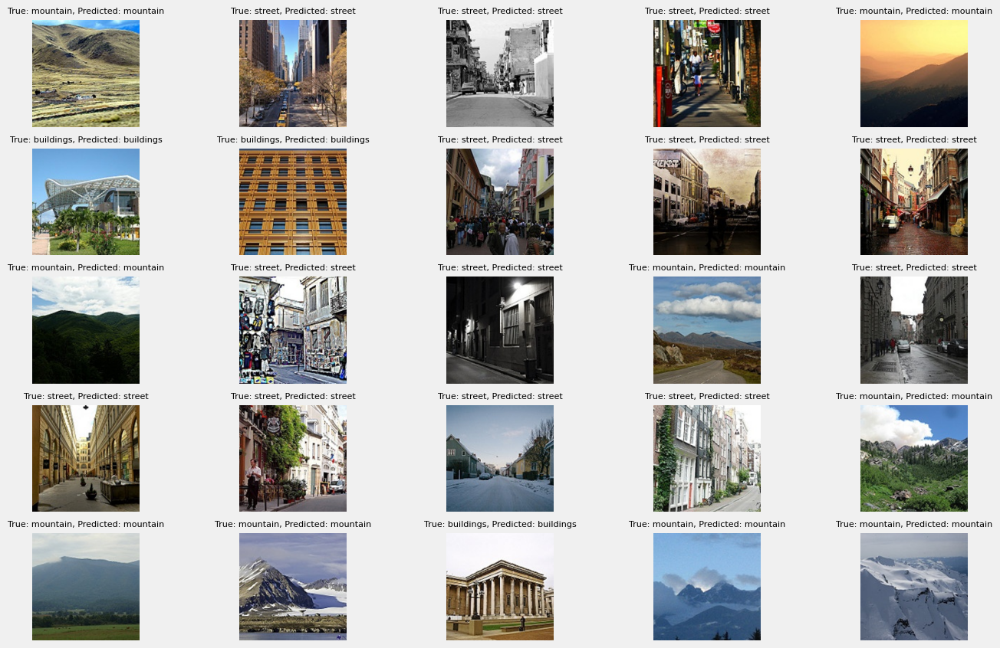

In [11]:
predictions = model.predict(test_img)

# Convert predictions to class labels
predicted_classes = np.argmax(predictions, axis=1)

print(predicted_classes)

# Visualize the predictions
plt.figure(figsize=(15, 10))
random_list2 = random.sample(range(7001), 25)
j=0
for i in random_list2: 
    plt.subplot(5, 5, j + 1)
    plt.imshow(test_img[i], cmap='gray')
    label1 = get_key_from_value(labels, test_lbl[i])
    label_code = test_lbl[i]
    label_name = [key for key, value in labels.items() if value == label_code][0]
    
    plt.title(f"True: {label1}, Predicted: {label_name}", fontsize=8)
    plt.axis('off')
    j+=1
plt.show()

In [12]:
model.save("InceptionModel.h5") # saving the model

# Confusion matrix and classification report

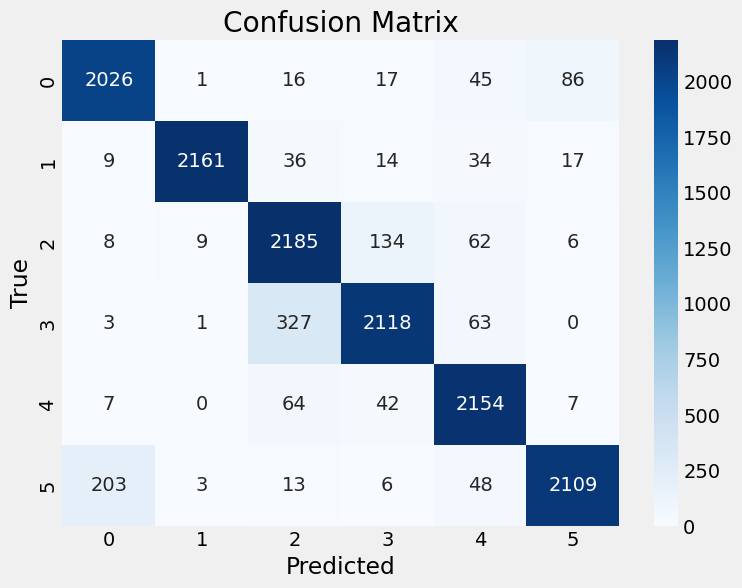


Classification Report:
              precision    recall  f1-score   support

   buildings       0.90      0.92      0.91      2191
      forest       0.99      0.95      0.97      2271
     glacier       0.83      0.91      0.87      2404
    mountain       0.91      0.84      0.87      2512
         sea       0.90      0.95      0.92      2274
      street       0.95      0.89      0.92      2382

    accuracy                           0.91     14034
   macro avg       0.91      0.91      0.91     14034
weighted avg       0.91      0.91      0.91     14034



In [13]:
# Create confusion matrix
cm = confusion_matrix(test_lbl, predicted_classes)

# Plot the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=labels.values(), yticklabels=labels.values())
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

# Extract class labels in the correct order
class_labels = list(labels.keys())

# Print classification report
print("\nClassification Report:")
print(classification_report(test_lbl, predicted_classes, target_names=class_labels))